In [1]:
import javabridge
import bioformats
javabridge.start_vm(class_path=bioformats.JARS)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from pylab import rcParams

rcParams['figure.figsize'] = 10, 10
%matplotlib inline

In [3]:
PATH = "test_data/C1.czi"
metadata = bioformats.get_omexml_metadata(path=PATH)
omexm = bioformats.OMEXML(xml=metadata)
imgdata = omexm.image()
x = imgdata.Pixels.SizeX
y = imgdata.Pixels.SizeY
z = imgdata.Pixels.SizeZ
stack = np.zeros((x, y, z))

for i in range(z):
    stack[:,:,i] = bioformats.load_image(PATH, c=0, z=i)
    
stack.shape

(512, 512, 70)

In [14]:
#http://www.robertwrose.com/2016/09/displaying-a-sequence-of-images-in-ipython-notebooks.html
from JSAnimation import IPython_display
from matplotlib import animation
from IPython.display import display

def plot_movie_js(stack):
    dpi = 72.0
    xpixels, ypixels = stack.shape[0], stack.shape[1]
    fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
    im = plt.figimage(stack[:,:,0])

    def animate(i):
        im.set_array(stack[:,:,i])
        return (im,)

    anim = animation.FuncAnimation(fig, animate, frames=stack.shape[2])
    display(IPython_display.display_animation(anim))


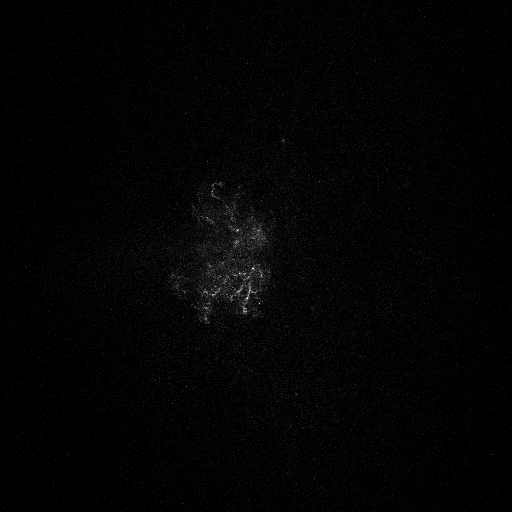
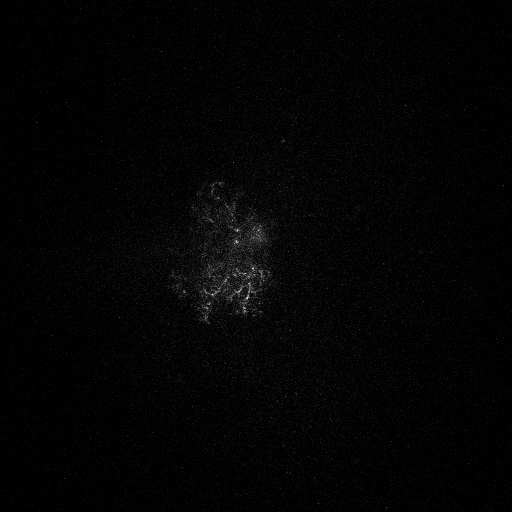
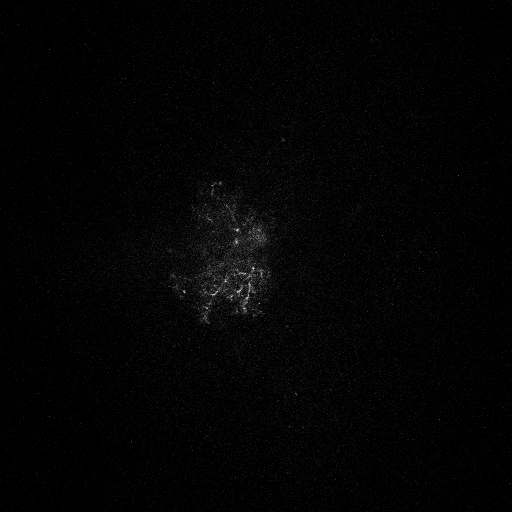
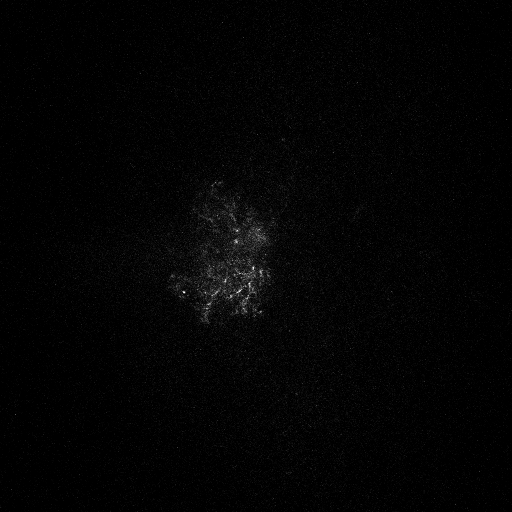
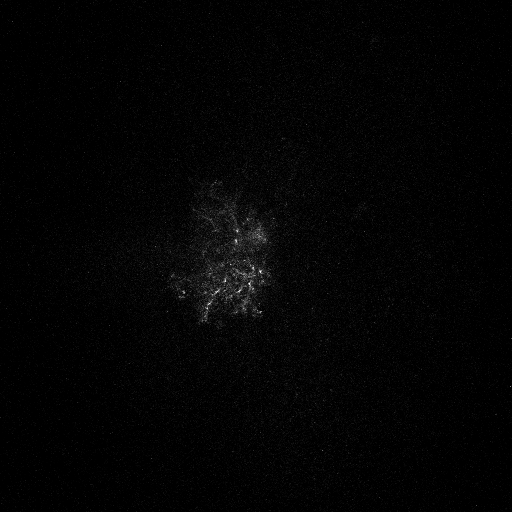
...
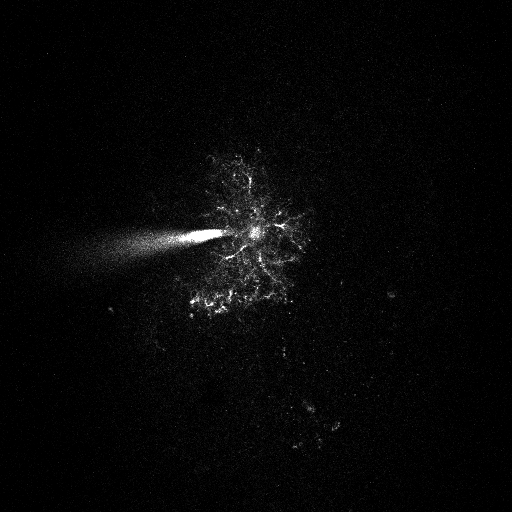
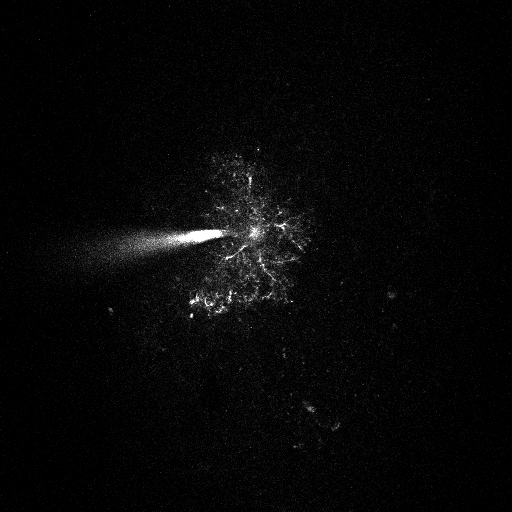
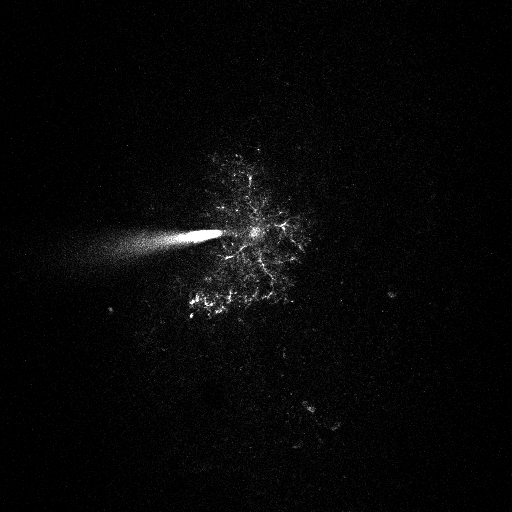
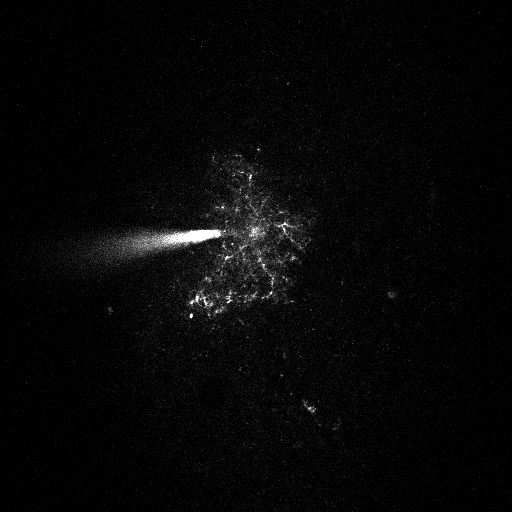
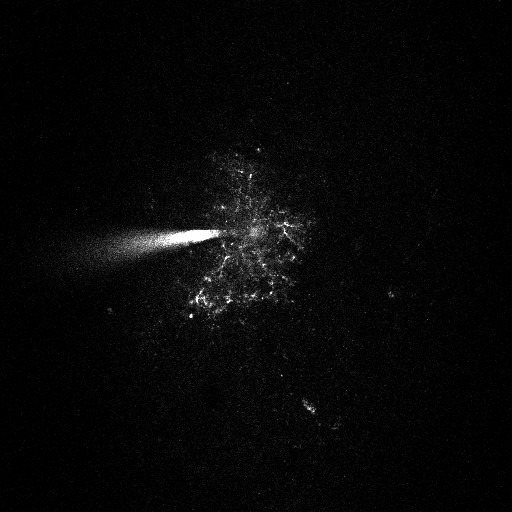

In [16]:
plt.gray()
plot_movie_js(stack)

In [5]:
from scipy.ndimage import generic_filter

def gaussian_part2d(sigma):
    x = np.arange(-3*sigma,3*sigma + 1)
    y = np.arange(-3*sigma,3*sigma + 1)
    X, Y = np.meshgrid(x, y)
    return -(X*X + Y*Y) / (2.0 * sigma**2)

def gaussian_part3d(sigma):
    x = np.arange(-3*sigma,3*sigma + 1)
    y = np.arange(-3*sigma,3*sigma + 1)
    z = np.arange(-3*sigma,3*sigma + 1)
    X, Y, Z = np.meshgrid(x, y, z)
    return -(X*X + Y*Y + Z*Z) / (2.0 * sigma**2)

def bilateral(arr, g_part, sigma_r):
    c = int(arr.shape[0] / 2)
    p_center = arr[c]
    i_part = (arr - p_center) ** 2 / (2.0 * sigma_r ** 2)
    kernel = np.exp(g_part - i_part)
    return np.sum(arr * kernel) / np.sum(kernel)

def bilateral_filter2d(img, sigma_d, sigma_r):
    g_part = gaussian_part2d(sigma_d)
    kwargs=dict(g_part=g_part.ravel(), sigma_r=sigma_r)
    return generic_filter(img, bilateral, size=g_part.shape, extra_keywords=kwargs)

def bilateral_filter3d(img, sigma_d, sigma_r):
    g_part = gaussian_part3d(sigma_d)
    kwargs=dict(g_part=g_part.ravel(), sigma_r=sigma_r)
    return generic_filter(img, bilateral, size=g_part.shape, extra_keywords=kwargs)

In [6]:
bilim = bilateral_filter3d(stack, 0.8, 0.15)